In [1]:
import pandas as pd
import numpy as np
import torch
import geopandas as gpd
import geodatasets
import matplotlib.pyplot as plt
import plotly.graph_objs as go
from plotly.subplots import make_subplots
from plotly import express as px
import plotly.figure_factory as ff
import contextily as cx
from tqdm import tqdm
from sklearn.linear_model import LinearRegression

import warnings, os
import mysql.connector as mysql
warnings.filterwarnings('ignore')
username = os.environ['MYSQL_user']
password = os.environ['MYSQL_password']
DB = mysql.connect(host = "localhost", user = username, passwd = password, database = "AIRBNB")
cursor = DB.cursor(buffered=True)

radius_meters = 100

## Utils

In [2]:
map_df = gpd.read_file('Data/neighbourhoods.geojson')
map_df.rename(columns={'neighbourhood_group':'borough'}, inplace=True)
map_df.head()

,neighbourhood,borough,geometry
0,Bayswater,Queens,"MULTIPOLYGON (((-73.76671 40.61491, -73.76825 ..."
1,Allerton,Bronx,"MULTIPOLYGON (((-73.8486 40.87167, -73.84582 4..."
2,City Island,Bronx,"MULTIPOLYGON (((-73.78282 40.84392, -73.78257 ..."
3,Ditmars Steinway,Queens,"MULTIPOLYGON (((-73.9016 40.76777, -73.90391 4..."
4,Ozone Park,Queens,"MULTIPOLYGON (((-73.83754 40.69136, -73.83108 ..."


In [3]:
def read_table_from_db(table_name):
    df = pd.read_sql(f'SELECT * FROM {table_name}', con=DB)
    df['geometry'] = gpd.GeoSeries.from_wkt(df['geometry'])
    df = gpd.GeoDataFrame(df, geometry='geometry')
    df.crs = "EPSG:4326"
    return df

In [4]:
class Plots:
    def __init__(self):
        self.quantiles_dict = {"Min": 0, "Q1": 0.25, "Med": 0.5, "Q3": 0.75, "Max": 1}

    def check_data(self, data):
        if not isinstance(data, pd.DataFrame) and not isinstance(data, pd.Series) and not isinstance(data, np.ndarray) and not torch.is_tensor(data):
            raise TypeError('Wrong type of data. It should be pandas DataFrame, pandas Series, numpy array or torch tensor.')
        data = np.array(data)
        if(data.ndim == 2):
            data = data.squeeze()
        return data
    
    def barplot(self, data, name=""):
        data = self.check_data(data=data)
        data = list(data)
        labels, frequency = np.unique(data, return_counts=True)
        sorted_indices = np.argsort(frequency)[::-1]
        labels = labels[sorted_indices]
        frequency = frequency[sorted_indices]
        n_colors = len(labels)
        colors = px.colors.sample_colorscale("rainbow", [n/(n_colors -1) for n in range(n_colors)])
        fig = go.Figure()
        fig.add_trace(go.Bar(x=labels, y=frequency, marker=dict(line=dict(color='black', width=1), color=colors), showlegend=False))
        fig.update_layout(template="simple_white", width=1600, height=800, title=f"<b>{name.title()}<b>", title_x=0.5, font=dict(family="Times New Roman",size=16,color="Black"))
        fig.show("png")
    
    def histogram_boxplot_linear_regression(self, data, feature, target, name="", annotations=True, bin_size=1):
        model = LinearRegression()
        no_nan_indices = ~data[feature].isna()
        model.fit(data[no_nan_indices][feature].values.reshape(-1, 1), data[no_nan_indices][target])
        predictions = model.predict(data[no_nan_indices][feature].values.reshape(-1, 1))
        fig = make_subplots(rows=1, cols=3, specs=[[{"type": "histogram"}, {"type": "box"}, {"type": "scatter"}]])
        fig.add_trace(go.Box(y=data[no_nan_indices][feature], name='', marker=dict(color="rgb(48,70,116)"), showlegend=False), row=1, col=1)
        fig.add_trace(go.Histogram(x=data[no_nan_indices][feature], marker=dict(color="rgb(48,70,116)"), showlegend=False, xbins=dict(size=bin_size)), row=1, col=2)
        fig.add_trace(go.Scatter(x=data[no_nan_indices][feature], y=data[no_nan_indices][target], mode='markers', marker=dict(color="lightblue"), name='Real values', showlegend=False), row=1, col=3)
        fig.add_trace(go.Scatter(x=data[no_nan_indices][feature], y=predictions, mode='lines', line_color="green", name=feature, showlegend=False), row=1, col=3)
        fig.update_xaxes(title_text=feature, row=1, col=3)
        fig.update_yaxes(title_text=f"{target}", row=1, col=3)
        if type(annotations) == list:
            for x in annotations:
                fig.add_annotation(x=0.4, y=np.quantile(data[feature], self.quantiles_dict[x]), text=x + ": " + str(np.round(np.quantile(data[feature], self.quantiles_dict[x]), 3)), showarrow=False)
        elif type(annotations) == bool:
            if annotations:
                for key, value in self.quantiles_dict.items():
                    fig.add_annotation(x=0.4, y=np.quantile(data[feature], value), text=key + ": " + str(np.round(np.quantile(data[feature], value), 3)), showarrow=False)
        fig.update_layout(template="simple_white", width=2000, height=800, title=f"<b>{name.title()} distribution<b>", title_x=0.5, font=dict(family="Times New Roman",size=16,color="Black"))
        fig.show("png")
    
    def pie_boxplot_by_categorical(self, data, categorical, target, name=""):
        data_copy = data.copy()
        data_copy.reset_index(drop=True, inplace=True)
        labels, frequency = np.array(data_copy[categorical].value_counts().index), np.array(data_copy[categorical].value_counts().values)
        sorted_indices = np.argsort(frequency)[::-1]
        labels = labels[sorted_indices]
        frequency = frequency[sorted_indices]
        colors = px.colors.qualitative.Dark24
        rows, columns = 1, 2
        fig = make_subplots(rows=rows, cols=columns, specs=[[{"type": "pie"}, {"type": "bar"}] for i in range(0, rows)])
        fig.add_trace(go.Pie(values=frequency, labels=labels, showlegend=True, textinfo='value+percent', hole=0.3, marker=dict(line=dict(color='black', width=2), colors=colors)), row=1, col=1)
        for color_idx, category in enumerate(labels):
            indices = list(np.where(data_copy[categorical]==category)[0])
            grouped_data = list(data_copy[target][indices])
            fig.add_trace(go.Box(y=grouped_data, name=str(category), marker=dict(color=colors[color_idx]), showlegend=False))
        fig.update_layout(template="simple_white", width=1600, height=800, title=f"<b>{name.title()} distribution<b>", title_x=0.5, font=dict(family="Times New Roman",size=16,color="Black"))
        fig.show("png")
    
    def correlation_plot(self, data, features_names, method="spearman"):
        data = self.check_data(data=data)
        data = pd.DataFrame(data, columns=features_names)
        corr = np.round(data[data.columns.tolist()].corr(method=method), 3)
        mask = np.triu(np.ones_like(corr, dtype=bool))
        data_mask = corr.mask(mask)
        fig = ff.create_annotated_heatmap(z=data_mask.to_numpy(), x=data_mask.columns.tolist(), y=data_mask.columns.tolist(), colorscale=px.colors.diverging.RdBu,hoverinfo="none", showscale=True, ygap=1, xgap=1)
        fig.update_xaxes(side="bottom")
        fig.update_layout(width=2000, height=2000, xaxis_showgrid=False,yaxis_showgrid=False,xaxis_zeroline=False,yaxis_zeroline=False,yaxis_autorange='reversed',template='plotly_white',font=dict(family="Times New Roman",size=12,color="Black"))
        for i in range(len(fig.layout.annotations)):
            if fig.layout.annotations[i].text == 'nan':
                fig.layout.annotations[i].text = ""
        fig.show("png")
    
    def plot_count_per_neighbourhood(self, data, title):
        fig, ax = plt.subplots(1, 1, figsize=(15, 10))
        gdf_joined = gpd.sjoin(data, map_df)
        grouped_per_neighbourhood = gdf_joined.groupby('neighbourhood').size().reset_index(name=title)
        grouped_per_neighbourhood = map_df.merge(grouped_per_neighbourhood, left_on='neighbourhood', right_on='neighbourhood')
        grouped_per_neighbourhood.plot(column=title, cmap='rainbow', legend=True, ax=ax, edgecolor='black', alpha=0.5, legend_kwds={'label': title.split(" per neighbourhood")[0], 'orientation': "vertical"})
        cx.add_basemap(ax, crs='EPSG:4326', source=cx.providers.CartoDB.PositronNoLabels, zoom=12, alpha=1.0)
        cx.add_basemap(ax, crs='EPSG:4326', source=cx.providers.CartoDB.PositronOnlyLabels, zoom=10, alpha=0.5)
        plt.title(title, fontweight='bold')
        ax.set_axis_off()
        plt.show()
    
    def plot_count_per_borough(self, data, title):
        fig, ax = plt.subplots(1, 1, figsize=(15, 10))
        nybb = gpd.read_file(geodatasets.get_path("nybb"))
        nybb = nybb.to_crs("EPSG:4326")
        nybb.rename(columns={'BoroName':'borough'}, inplace=True)
        gdf_joined = gpd.sjoin(data, nybb)
        grouped_per_borough = gdf_joined.groupby('borough').size().reset_index(name=title)
        grouped_per_borough = nybb.merge(grouped_per_borough, left_on='borough', right_on='borough')
        grouped_per_borough.plot(column=title, cmap='rainbow', legend=True, ax=ax, edgecolor='black', alpha=0.5, legend_kwds={'label': title.split(" per borough")[0], 'orientation': "vertical"})
        cx.add_basemap(ax, crs='EPSG:4326', source=cx.providers.CartoDB.PositronNoLabels, zoom=12, alpha=1.0)
        cx.add_basemap(ax, crs='EPSG:4326', source=cx.providers.CartoDB.PositronOnlyLabels, zoom=10, alpha=0.5)
        plt.title(title, fontweight='bold')
        ax.set_axis_off()
        plt.show()
    
    def plot_points(self, data, title, marker_color, marker_size=5):
        fig, ax = plt.subplots(1, 1, figsize=(15, 10))
        data.plot(ax=ax, color=marker_color, markersize=marker_size, alpha=0.8, legend=False, zorder=2)
        map_df.plot(ax=ax, color="none", edgecolor="black", alpha=0.5)
        cx.add_basemap(ax, crs='EPSG:4326', source=cx.providers.CartoDB.PositronNoLabels, zoom=12, alpha=1.0)
        cx.add_basemap(ax, crs='EPSG:4326', source=cx.providers.CartoDB.PositronOnlyLabels, zoom=10, alpha=0.5)
        plt.title(title, fontweight='bold')
        ax.set_axis_off()
        plt.show()
    
plots = Plots()

In [5]:
def get_distance_to_nearest_point(listings, other_gdf):
    listings_projected = listings.to_crs('ESRI:102003')
    other_gdf_projected = other_gdf.to_crs('ESRI:102003')
    distance_to_nearest_point = []
    for idx, listing in tqdm(listings_projected.iterrows(), total=len(listings_projected)):
        distance = listing['geometry'].distance(other_gdf_projected['geometry'])
        distance_to_nearest_point.append(distance.min())
    return distance_to_nearest_point

def get_number_of_points_within_radius(listings, other_gdf, radius_meters):
    listings_projected = listings.to_crs('ESRI:102003')
    other_gdf_projected = other_gdf.to_crs('ESRI:102003')
    number_of_points_within_radius = []
    for idx, listing in tqdm(listings_projected.iterrows(), total=len(listings_projected)):
        number_of_points_within_radius.append(len(other_gdf_projected[other_gdf_projected['geometry'].distance(listing['geometry']) < radius_meters]))
    return number_of_points_within_radius

# Listings

In [6]:
table_name = "listings_eda"
listings = read_table_from_db(table_name)
listings.head()

,listing_id,listing_url,host_is_superhost,host_has_profile_pic,host_identity_verified,accommodates,bedrooms,beds,minimum_nights,maximum_nights,...,review_scores_location_0_50,review_scores_location_51_80,review_scores_location_81_90,review_scores_location_91_95,review_scores_location_96_100,review_scores_value_0_50,review_scores_value_51_80,review_scores_value_81_90,review_scores_value_91_95,review_scores_value_96_100
0,2595,https://www.airbnb.com/rooms/2595,0,1,1,1.0,0.0,1.0,30.0,1125.0,...,0,0,0,0,1,0,0,1,0,0
1,5121,https://www.airbnb.com/rooms/5121,0,1,1,2.0,1.0,1.0,30.0,150.0,...,0,0,1,0,0,0,0,0,1,0
2,5136,https://www.airbnb.com/rooms/5136,0,1,1,4.0,2.0,2.0,30.0,730.0,...,0,0,0,1,0,0,0,0,1,0
3,6848,https://www.airbnb.com/rooms/6848,1,1,1,3.0,2.0,1.0,30.0,730.0,...,0,0,0,1,0,0,0,0,1,0
4,6872,https://www.airbnb.com/rooms/6872,0,1,1,1.0,1.0,1.0,30.0,180.0,...,0,0,0,0,1,0,0,0,0,1


## Neighborhood map

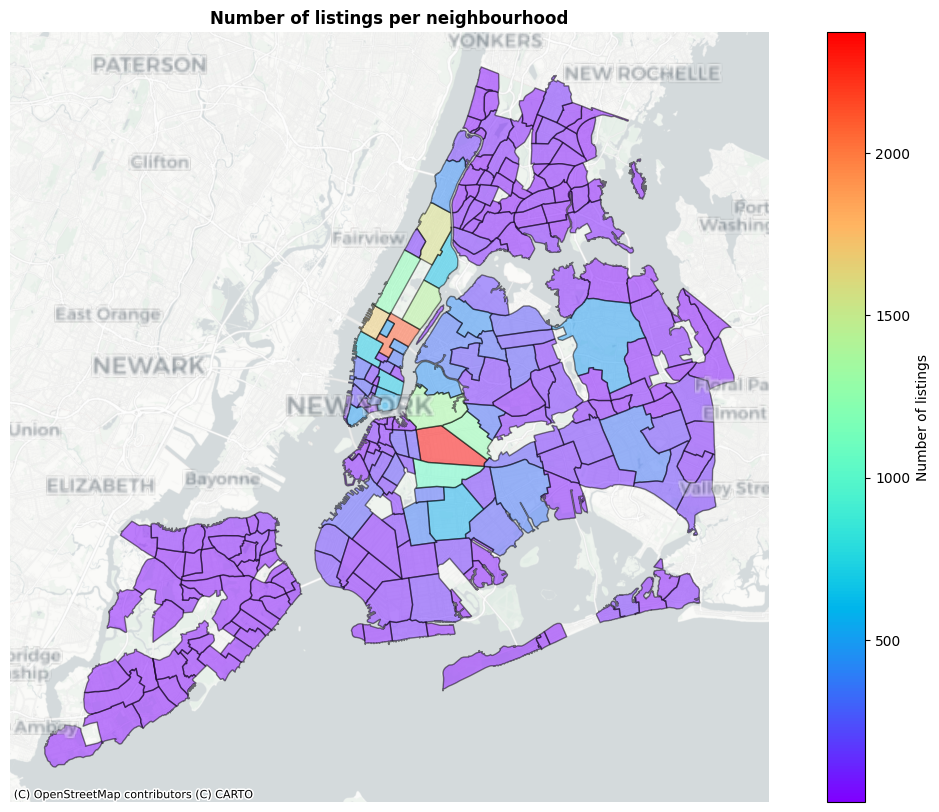

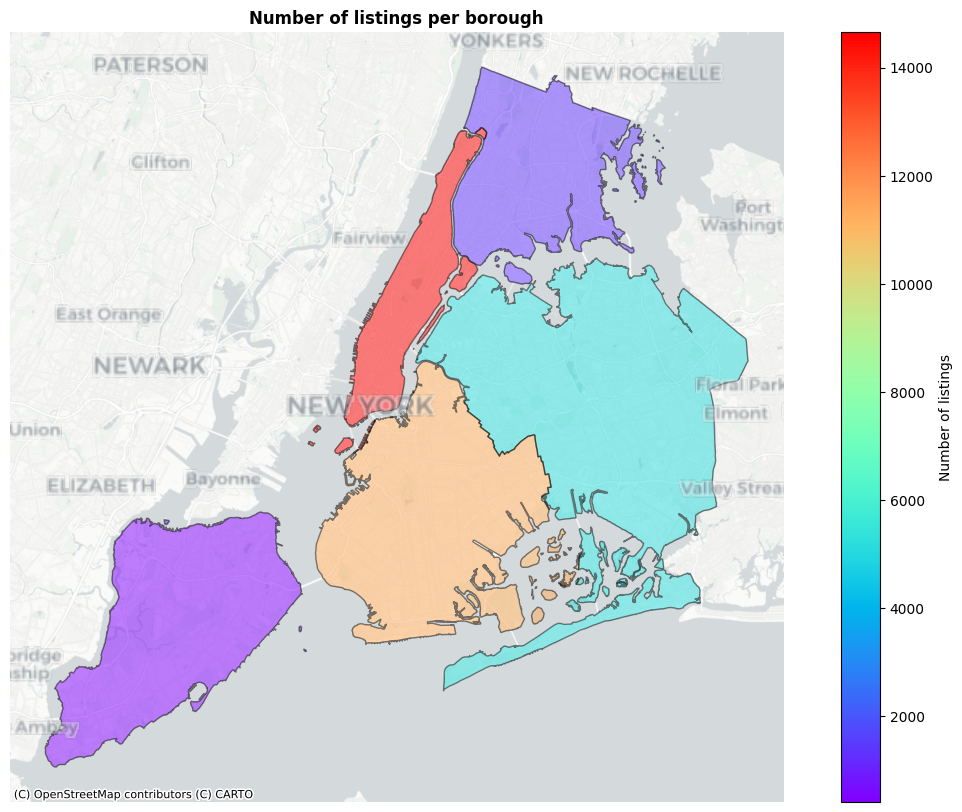

In [7]:
plots.plot_count_per_neighbourhood(listings, "Number of listings per neighbourhood")
plots.plot_count_per_borough(listings, "Number of listings per borough")

**Notes:**
- There are 5 boroughs: Manhattan, Brooklyn, Queens, Bronx, and Staten Island.
- Borough with most listings is Manhattan, followed by Brooklyn.

We will assign for each listing a neighborhood and borough based on `geometry` column and map_df dataframe. 

In [8]:
for idx, listing in tqdm(listings.iterrows(), total=len(listings)):
    for _, neighbourhood in map_df.iterrows():
        if listing['geometry'].within(neighbourhood['geometry']):
            listings.at[idx, 'neighbourhood'] = neighbourhood['neighbourhood']
            listings.at[idx, 'borough'] = neighbourhood['borough']
            break

100%|██████████| 32826/32826 [01:22<00:00, 397.37it/s]


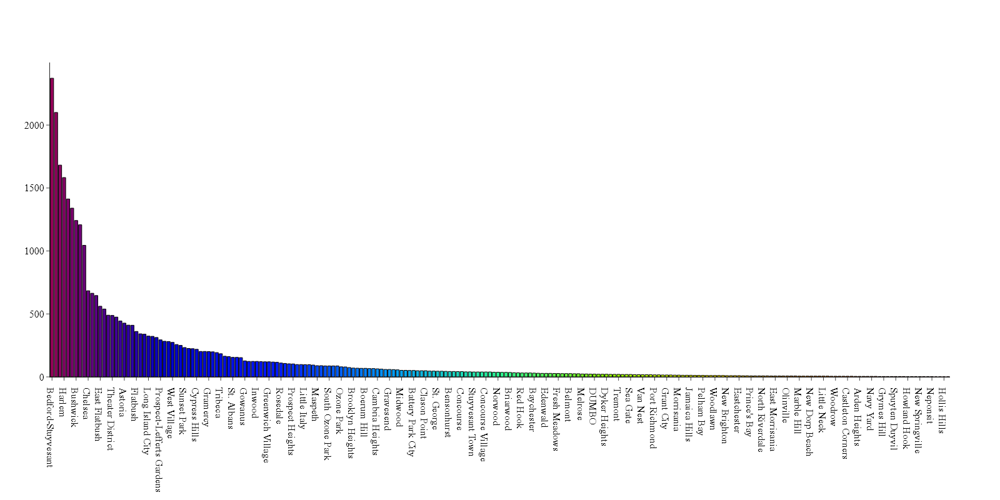

In [9]:
plots.barplot(listings["neighbourhood"])

**Notes:**
- Neighborhood with most listings is Williamsburg with more than 4000 listings.

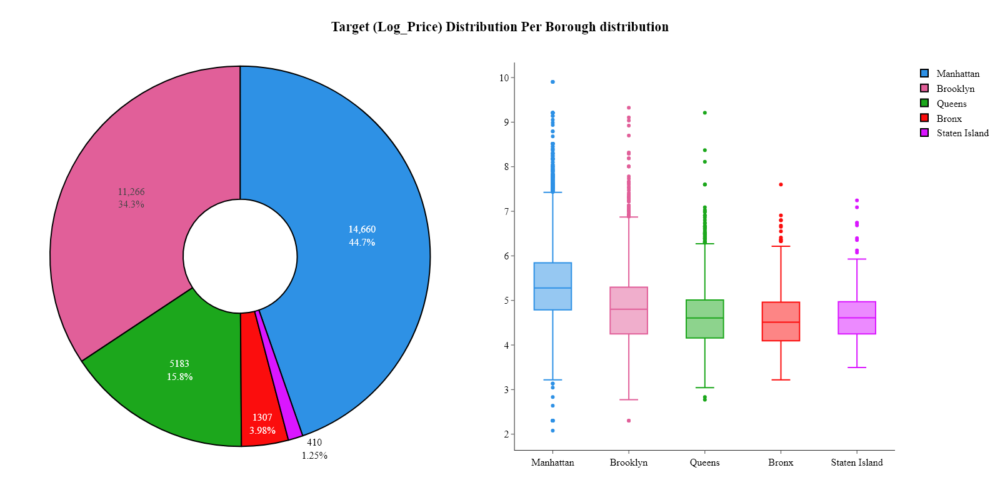

In [10]:
plots.pie_boxplot_by_categorical(listings, "borough", "log_price", name="Target (log_price) distribution per borough")

**Notes:**
- The highest median `log_price` is in Manhattan, the lowest in Staten Island.

**Conclusion:**
- I will apply One-Hot Encoding to convert `borough` variable into a numerical format. I will use Staten Island as a reference category due to the fact that it has the lowest median `log_price` and is least frequent in the dataset.

In [11]:
listings = pd.get_dummies(listings, columns=['borough'], drop_first=False)
listings.drop(['borough_Staten Island'], axis=1, inplace=True)

# Crimes

In [12]:
table_name = 'crimes'
crimes_gdf = read_table_from_db(table_name)
crimes_gdf.head()

,id,latitude,longitude,offence,offence_weight,geometry
0,1,40.5452,-74.1696,Criminal harassment,45,POINT (-74.16959 40.54522)
1,2,40.5823,-74.1691,Criminal harassment,45,POINT (-74.16907 40.5823)
2,3,40.6389,-74.1674,Fraud,109,POINT (-74.1674 40.63893)
3,4,40.6269,-74.1634,Weapons possession,88,POINT (-74.16344 40.62685)
4,5,40.6313,-74.1559,Assault - level 3,405,POINT (-74.15587 40.63133)


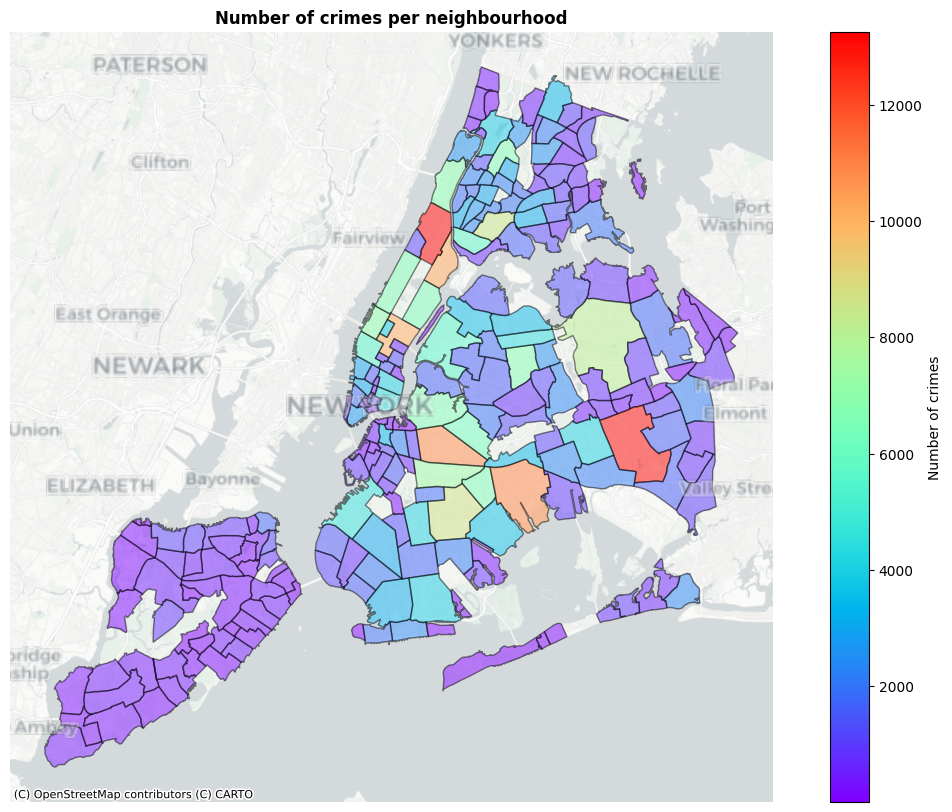

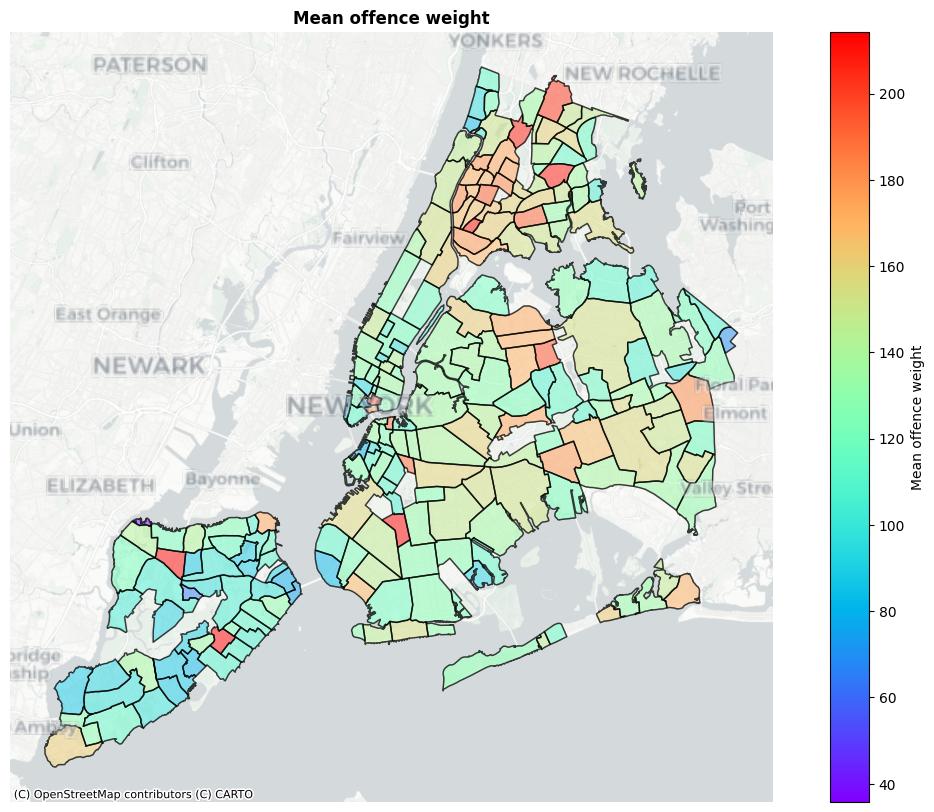

In [13]:
plots.plot_count_per_neighbourhood(crimes_gdf, 'Number of crimes per neighbourhood')

fig, ax = plt.subplots(1, 1, figsize=(15, 10))
crimes_gdf_joined = gpd.sjoin(crimes_gdf, map_df)
crimes_per_neighbourhood = crimes_gdf_joined.groupby('neighbourhood')['offence_weight'].mean().reset_index(name='Mean offence weight per neighbourhood')
crimes_per_neighbourhood = map_df.merge(crimes_per_neighbourhood, left_on='neighbourhood', right_on='neighbourhood')
crimes_per_neighbourhood.plot(column='Mean offence weight per neighbourhood', cmap='rainbow', legend=True, ax=ax, edgecolor='black', alpha=0.5, legend_kwds={'label': "Mean offence weight", 'orientation': "vertical"})
map_df.plot(ax=ax, color="none", edgecolor="black", alpha=0.5)
plt.title("Mean offence weight", fontweight='bold')
cx.add_basemap(ax, crs='EPSG:4326', source=cx.providers.CartoDB.PositronNoLabels, zoom=12, alpha=1.0)
cx.add_basemap(ax, crs='EPSG:4326', source=cx.providers.CartoDB.PositronOnlyLabels, zoom=10, alpha=0.5)
ax.set_axis_off()
plt.show()

**Notes:**
- It looks like the west side of New York City has least crimes.

In [14]:
listings['distance_to_nearest_crime_m'] = get_distance_to_nearest_point(listings, crimes_gdf)

100%|██████████| 32826/32826 [48:23<00:00, 11.31it/s]


In [15]:
listings[f'number_of_crimes_within_{radius_meters}m'] = get_number_of_points_within_radius(listings, crimes_gdf, radius_meters)

100%|██████████| 32826/32826 [48:20<00:00, 11.32it/s]


In [16]:
def get_average_offence_weight_within_radius(listings, crimes_gdf, radius_meters):
    listings_projected = listings.to_crs('ESRI:102003')
    crimes_gdf_projected = crimes_gdf.to_crs('ESRI:102003')
    average_offence_weight_within_radius = []
    for idx, listing in tqdm(listings_projected.iterrows(), total=len(listings_projected)):
        crimes_within_radius = crimes_gdf_projected[crimes_gdf_projected['geometry'].distance(listing['geometry']) < radius_meters]
        if len(crimes_within_radius) == 0:
            average_offence_weight_within_radius.append(0)
            continue
        average_offence_weight_within_radius.append(crimes_within_radius['offence_weight'].mean())
    return average_offence_weight_within_radius

listings[f"average_offence_weight_within_{radius_meters}m"] = get_average_offence_weight_within_radius(listings, crimes_gdf, radius_meters)

100%|██████████| 32826/32826 [47:59<00:00, 11.40it/s]


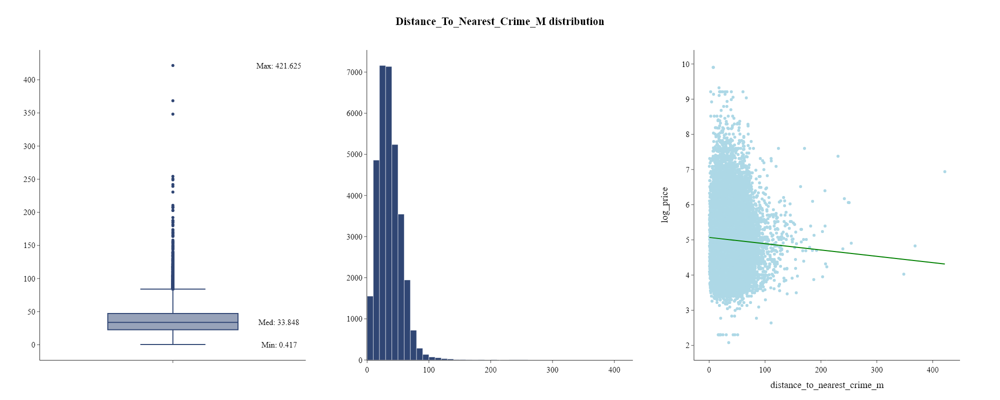

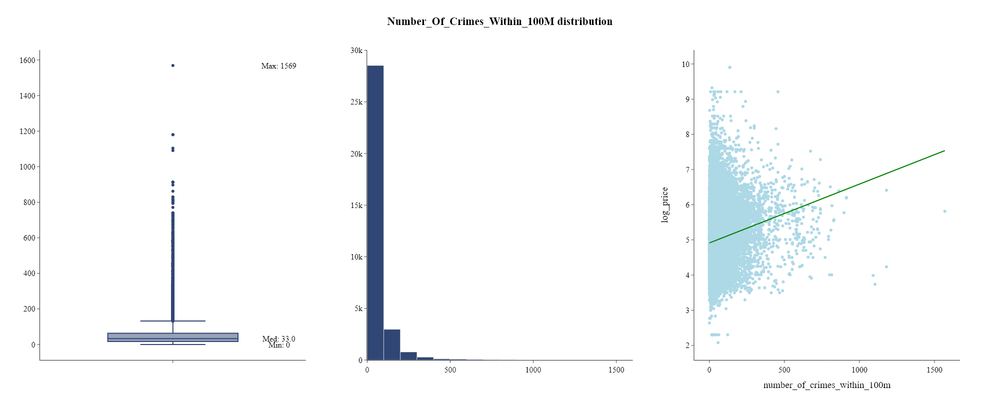

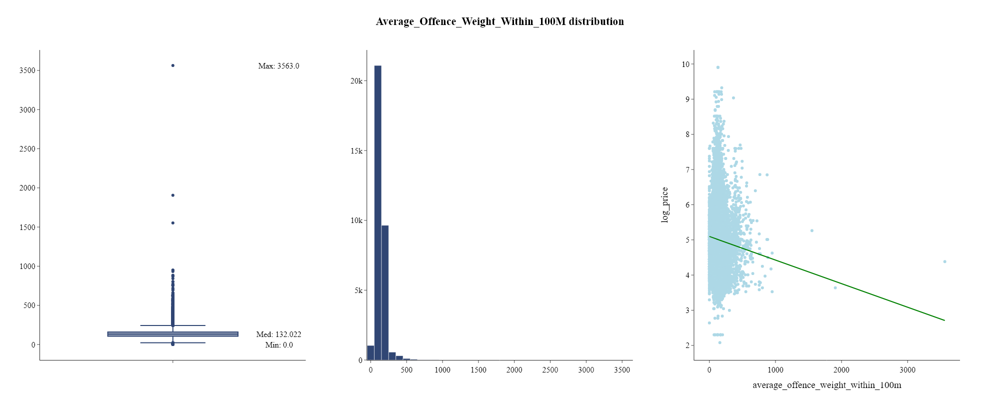

In [55]:
plots.histogram_boxplot_linear_regression(listings, "distance_to_nearest_crime_m", "log_price", name="distance_to_nearest_crime_m", annotations=["Min", "Med", "Max"], bin_size=10)
plots.histogram_boxplot_linear_regression(listings, f'number_of_crimes_within_{radius_meters}m', "log_price", name=f'number_of_crimes_within_{radius_meters}m', annotations=["Min", "Med", "Max"], bin_size=100)
plots.histogram_boxplot_linear_regression(listings, f"average_offence_weight_within_{radius_meters}m", "log_price", name=f"average_offence_weight_within_{radius_meters}m", annotations=["Min", "Med", "Max"], bin_size=100)

**Notes:**
- The higher the number of crimes, the lower the median `log_price`.

# Bus stops

In [18]:
table_name = 'bus_stops'
bus_stops_gdf = read_table_from_db(table_name)
bus_stops_gdf.head()

,id,latitude,longitude,geometry
0,1,40.7313,-73.9903,POINT (-73.99029 40.73134)
1,2,40.7326,-73.9900,POINT (-73.98996 40.73261)
2,3,40.7339,-73.9897,POINT (-73.98972 40.73394)
3,4,40.7390,-73.9871,POINT (-73.98705 40.73898)
4,5,40.7663,-73.9693,POINT (-73.96933 40.76627)


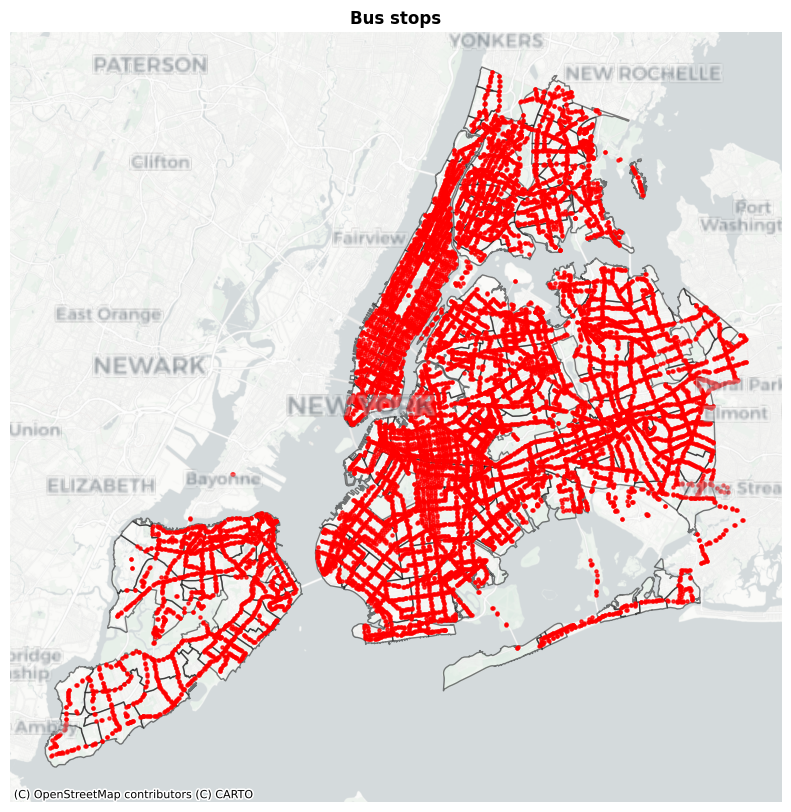

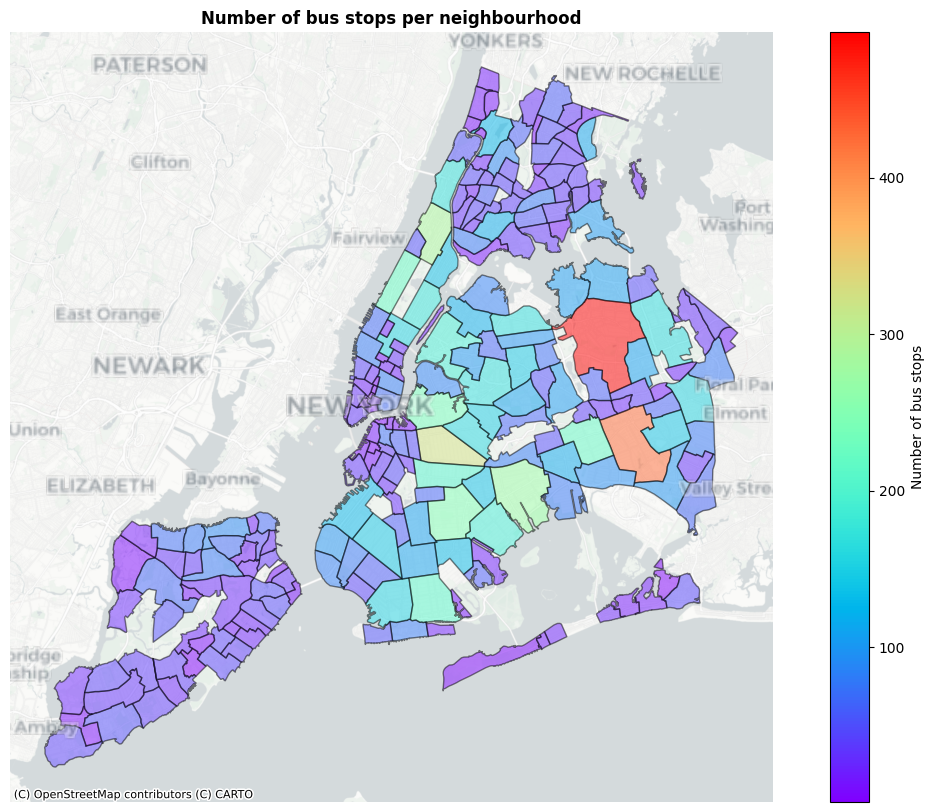

In [19]:
plots.plot_points(bus_stops_gdf, 'Bus stops', 'red')
plots.plot_count_per_neighbourhood(bus_stops_gdf, 'Number of bus stops per neighbourhood')

In [20]:
listings['distance_to_nearest_bus_stop_m'] = get_distance_to_nearest_point(listings, bus_stops_gdf)
listings[f'number_of_bus_stops_within_{radius_meters}m'] = get_number_of_points_within_radius(listings, bus_stops_gdf, radius_meters)

100%|██████████| 32826/32826 [01:50<00:00, 298.40it/s]


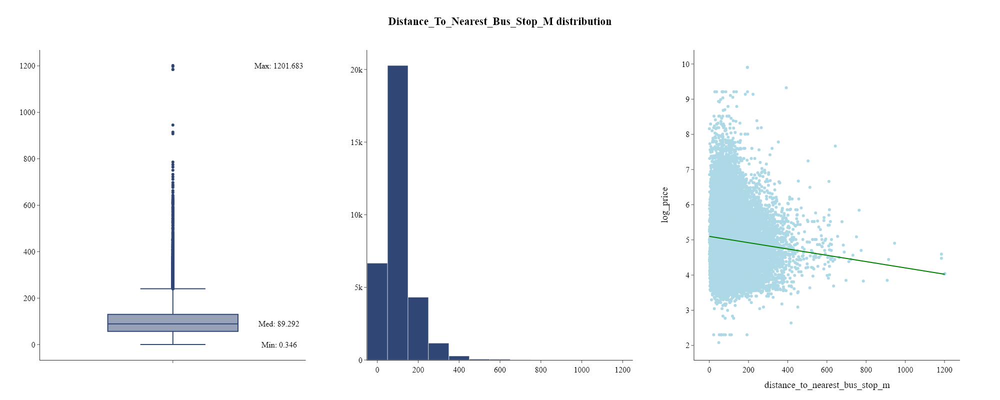

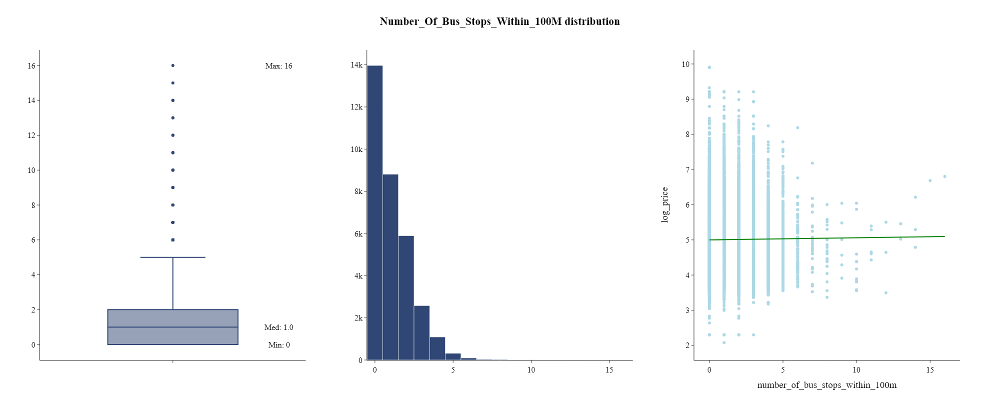

In [21]:
plots.histogram_boxplot_linear_regression(listings, "distance_to_nearest_bus_stop_m", "log_price", name="distance_to_nearest_bus_stop_m", annotations=["Min", "Med", "Max"], bin_size=100)
plots.histogram_boxplot_linear_regression(listings, f'number_of_bus_stops_within_{radius_meters}m', "log_price", name=f'number_of_bus_stops_within_{radius_meters}m', annotations=["Min", "Med", "Max"], bin_size=1)

# Subway stations

In [22]:
subway_stations_gdf = read_table_from_db('subway_stations')
subway_stations_gdf.head()

,id,latitude,longitude,geometry
0,1,40.8892,-73.8986,POINT (-73.89858 40.88925)
1,2,40.8847,-73.9009,POINT (-73.90087 40.88467)
2,3,40.8789,-73.9048,POINT (-73.90483 40.87886)
3,4,40.9031,-73.8506,POINT (-73.85062 40.90312)
4,5,40.8984,-73.8544,POINT (-73.85438 40.89838)


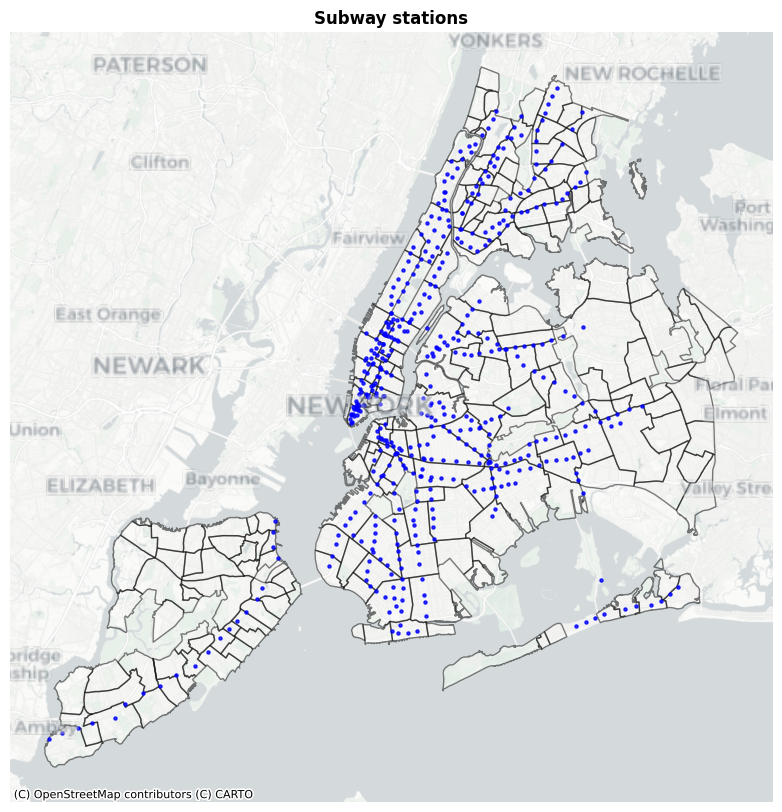

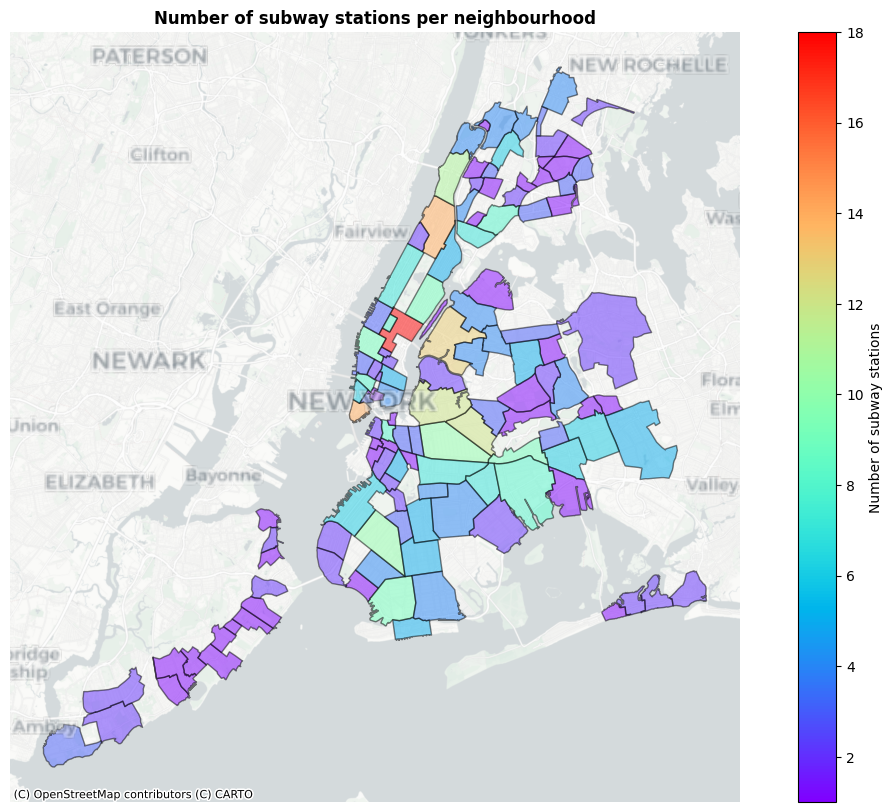

In [23]:
plots.plot_points(subway_stations_gdf, 'Subway stations', 'blue')
plots.plot_count_per_neighbourhood(subway_stations_gdf, 'Number of subway stations per neighbourhood')

In [24]:
listings['distance_to_nearest_subway_station_m'] = get_distance_to_nearest_point(listings, subway_stations_gdf)
listings[f'number_of_subway_stations_within_{radius_meters}m'] = get_number_of_points_within_radius(listings, subway_stations_gdf, radius_meters)

100%|██████████| 32826/32826 [00:11<00:00, 2947.47it/s]


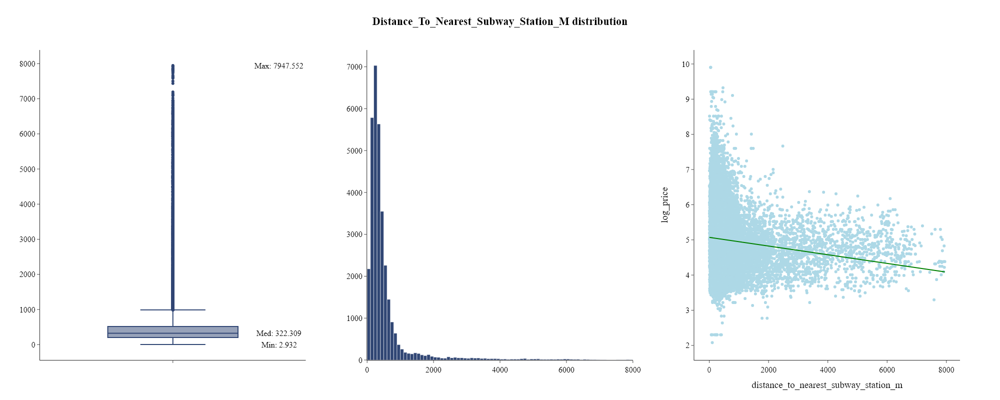

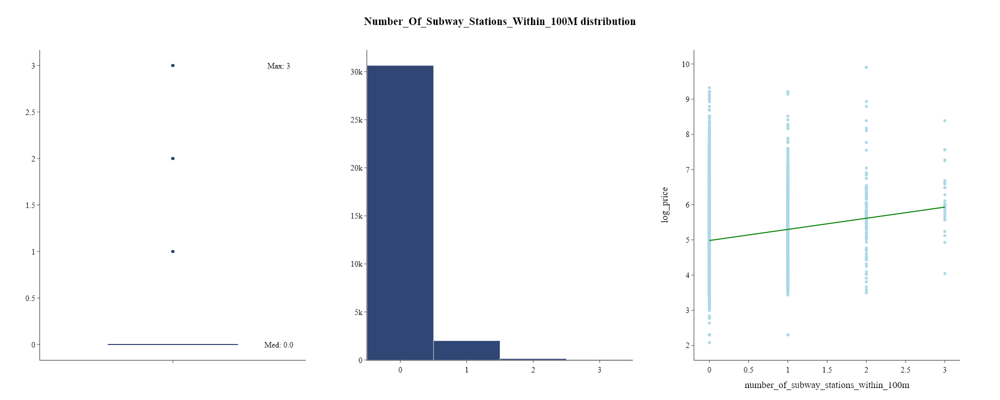

In [60]:
plots.histogram_boxplot_linear_regression(listings, "distance_to_nearest_subway_station_m", "log_price", name="distance_to_nearest_subway_station_m", annotations=["Min", "Med", "Max"], bin_size=100)
plots.histogram_boxplot_linear_regression(listings, f'number_of_subway_stations_within_{radius_meters}m', "log_price", name=f'number_of_subway_stations_within_{radius_meters}m', annotations=["Med", "Max"], bin_size=1)

# Restaurants

In [26]:
restaurants_gdf = read_table_from_db('restaurants')
restaurants_gdf.head()

,id,latitude,longitude,geometry
0,1,40.6256,-74.0242,POINT (-74.02425 40.62557)
1,2,40.8270,-73.9264,POINT (-73.92641 40.82696)
2,3,40.7520,-73.9393,POINT (-73.93932 40.75197)
3,4,40.7155,-73.7477,POINT (-73.74771 40.71551)
4,5,40.7178,-73.9893,POINT (-73.98928 40.71784)


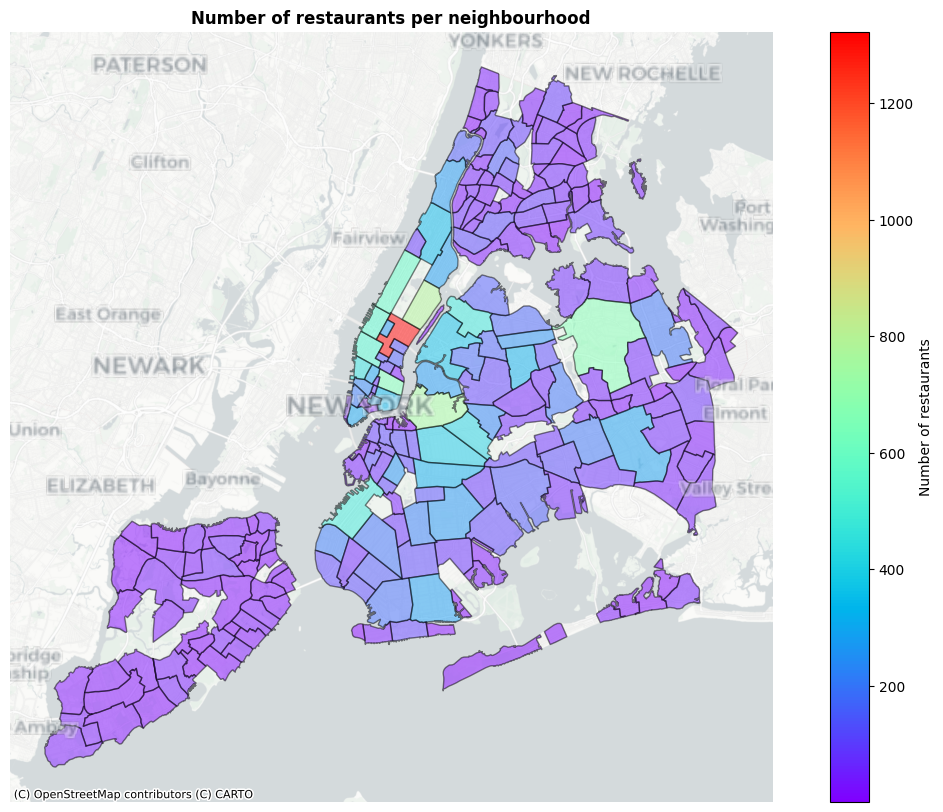

In [27]:
plots.plot_count_per_neighbourhood(restaurants_gdf, 'Number of restaurants per neighbourhood')

In [28]:
listings['distance_to_nearest_restaurant_m'] = get_distance_to_nearest_point(listings, restaurants_gdf)
listings[f'number_of_restaurants_within_{radius_meters}m'] = get_number_of_points_within_radius(listings, restaurants_gdf, radius_meters)

  0%|          | 0/32826 [00:00<?, ?it/s]

100%|██████████| 32826/32826 [02:52<00:00, 190.03it/s]


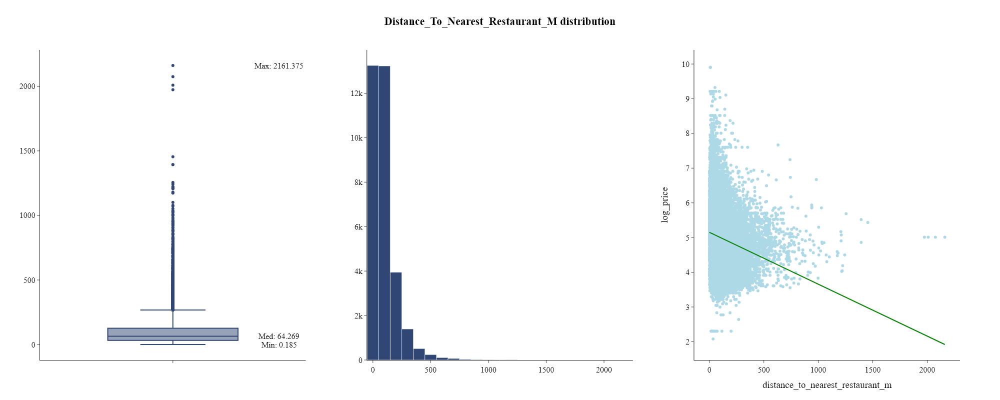

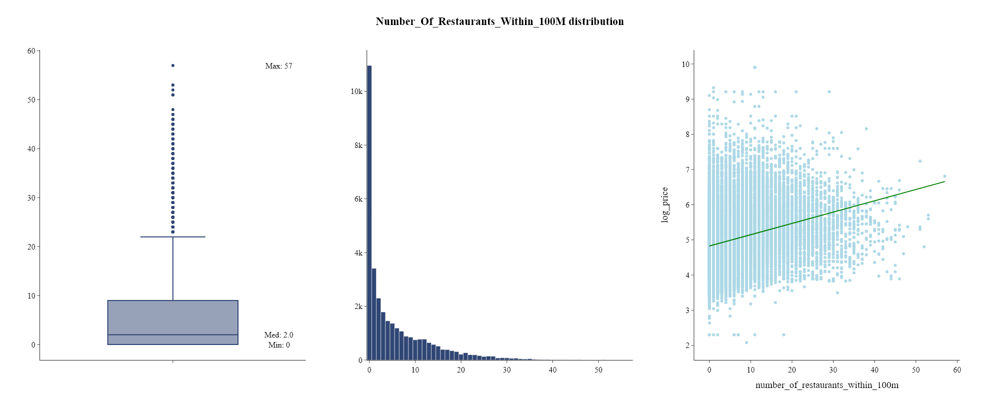

In [29]:
plots.histogram_boxplot_linear_regression(listings, "distance_to_nearest_restaurant_m", "log_price", name="distance_to_nearest_restaurant_m", annotations=["Min", "Med", "Max"], bin_size=100)
plots.histogram_boxplot_linear_regression(listings, f'number_of_restaurants_within_{radius_meters}m', "log_price", name=f'number_of_restaurants_within_{radius_meters}m', annotations=["Min", "Med", "Max"], bin_size=1)

## Education

In [30]:
education_gdf = read_table_from_db('education')
education_gdf.head()

,id,name,latitude,longitude,geometry
0,1,LONG ISLAND CITY HIGH SCHOOL,40.7655,-73.9327,POINT (-73.93271 40.76552)
1,2,PS/IS 268,40.7077,-73.7853,POINT (-73.78528 40.70767)
2,3,BENJAMIN N CARDOZO HIGH SCHOOL,40.7518,-73.7562,POINT (-73.75618 40.75175)
3,4,ACADEMY OF AMERICAN STUDIES HIGH SCHOOL,40.7523,-73.9364,POINT (-73.93645 40.75227)
4,5,JHS 185 EDWARD BLEEKER,40.7750,-73.8185,POINT (-73.81854 40.77504)


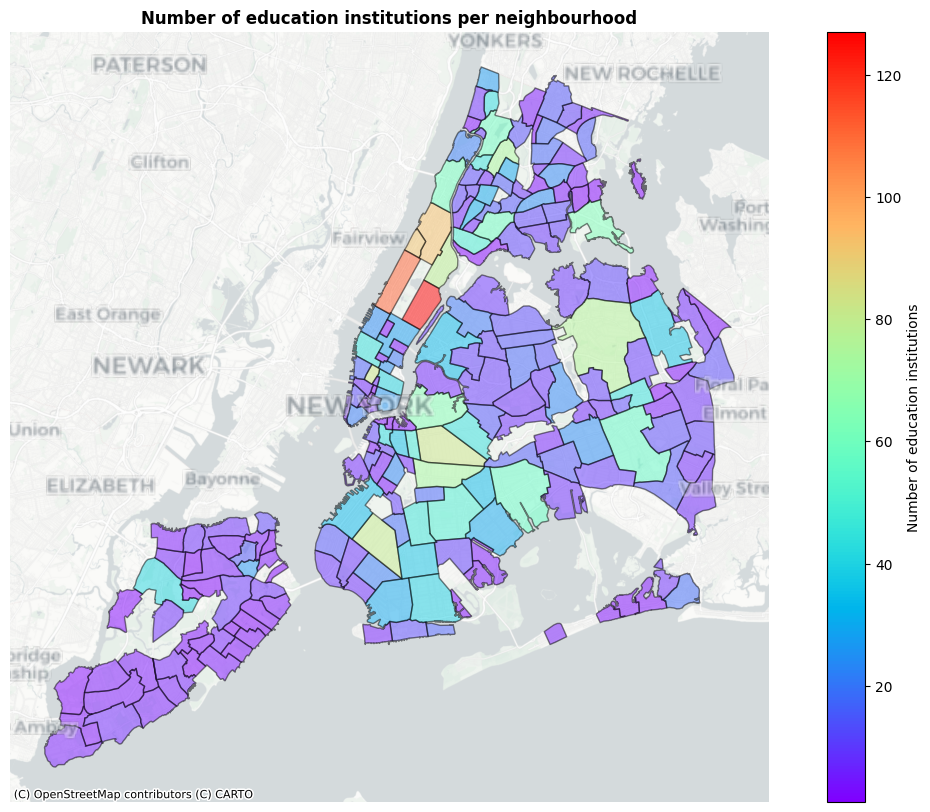

In [31]:
plots.plot_count_per_neighbourhood(education_gdf, 'Number of education institutions per neighbourhood')

In [32]:
listings['distance_to_nearest_education_institution_m'] = get_distance_to_nearest_point(listings, education_gdf)
listings[f'number_of_education_institutions_within_{radius_meters}m'] = get_number_of_points_within_radius(listings, education_gdf, radius_meters)

100%|██████████| 32826/32826 [00:34<00:00, 961.48it/s]


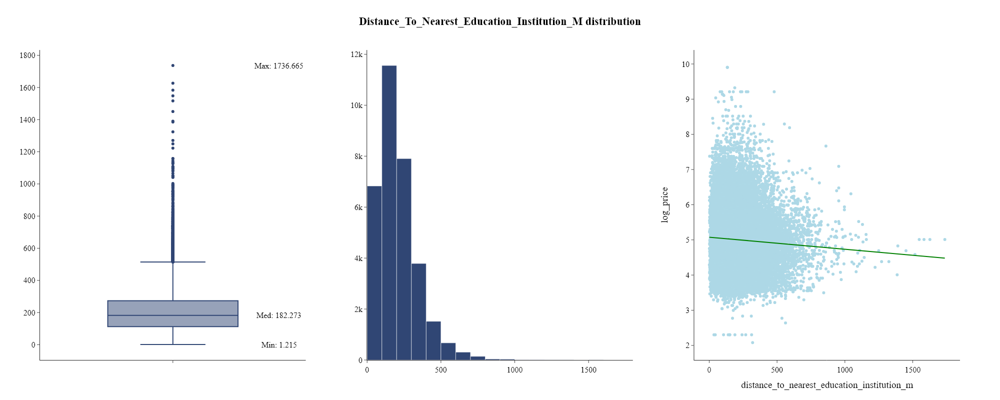

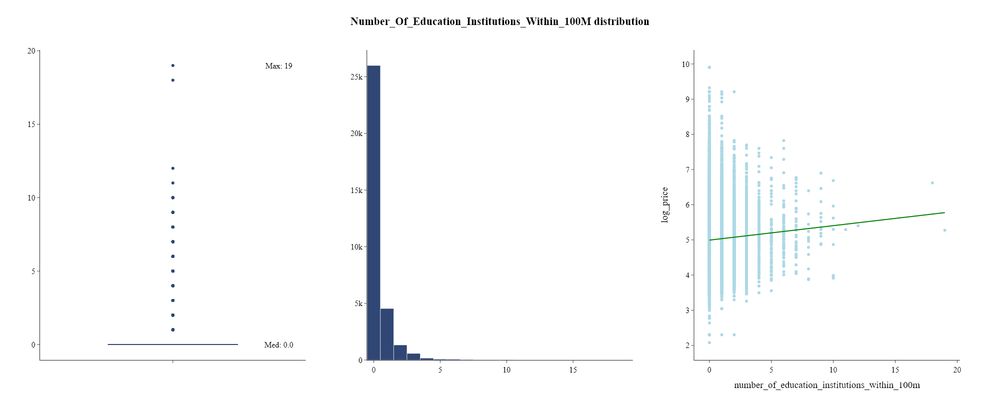

In [59]:
plots.histogram_boxplot_linear_regression(listings, "distance_to_nearest_education_institution_m", "log_price", name="distance_to_nearest_education_institution_m", annotations=["Min", "Med", "Max"], bin_size=100)
plots.histogram_boxplot_linear_regression(listings, f'number_of_education_institutions_within_{radius_meters}m', "log_price", name=f'number_of_education_institutions_within_{radius_meters}m', annotations=["Med", "Max"], bin_size=1)

## Culture

In [34]:
cultural_gdf = read_table_from_db('cultural')
cultural_gdf.head()

,id,name,latitude,longitude,geometry
0,1,SQUADRON A ARMORY,40.7857,-73.9540,POINT (-73.95396 40.78567)
1,2,DIA ART FOUNDATION CHELSEA GALLERY,40.7478,-74.0062,POINT (-74.00617 40.74785)
2,3,AMERICAN MUSEUM OF NATURAL HISTORY,40.7811,-73.9736,POINT (-73.97356 40.78106)
3,4,BAYSIDE LIBRARY,40.7602,-73.7683,POINT (-73.76834 40.76017)
4,5,BROAD CHANNEL LIBRARY,40.6008,-73.8201,POINT (-73.82005 40.60076)


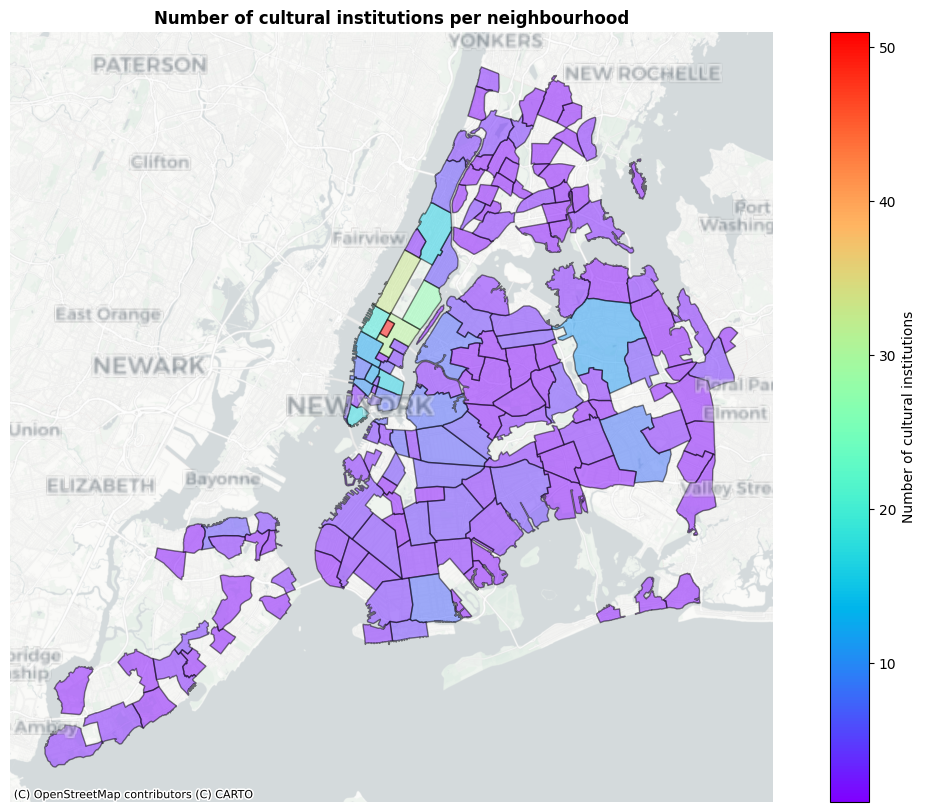

In [35]:
plots.plot_count_per_neighbourhood(cultural_gdf, 'Number of cultural institutions per neighbourhood')

In [36]:
listings['distance_to_nearest_cultural_institution_m'] = get_distance_to_nearest_point(listings, cultural_gdf)
listings[f'number_of_cultural_institutions_within_{radius_meters}m'] = get_number_of_points_within_radius(listings, cultural_gdf, radius_meters)

100%|██████████| 32826/32826 [00:11<00:00, 2746.26it/s]


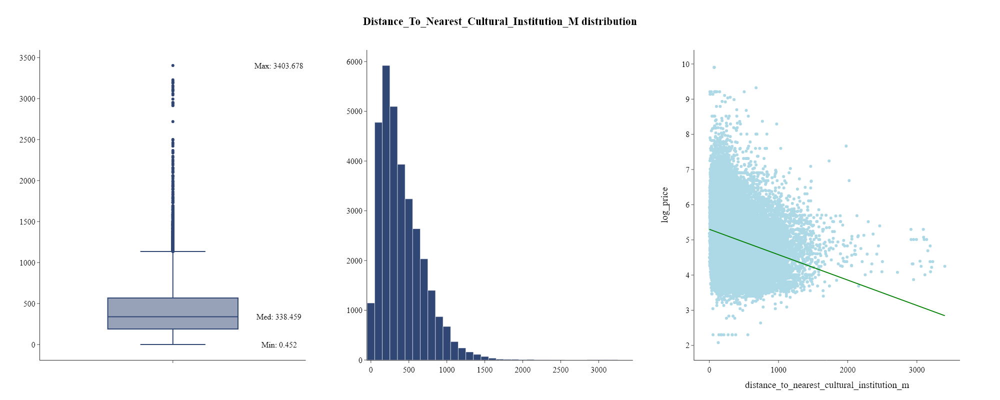

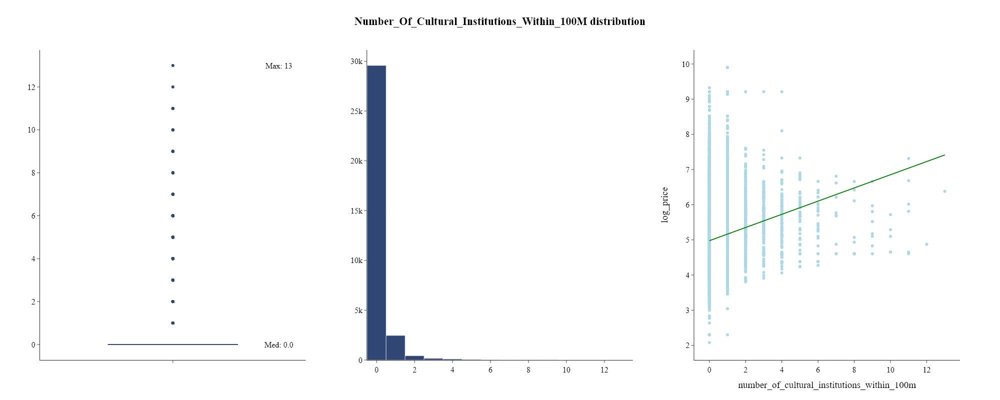

In [58]:
plots.histogram_boxplot_linear_regression(listings, "distance_to_nearest_cultural_institution_m", "log_price", name="distance_to_nearest_cultural_institution_m", annotations=["Min", "Med", "Max"], bin_size=100)
plots.histogram_boxplot_linear_regression(listings, f'number_of_cultural_institutions_within_{radius_meters}m', "log_price", name=f'number_of_cultural_institutions_within_{radius_meters}m', annotations=["Med", "Max"], bin_size=1)

## Recreation

In [38]:
recreation_gdf = read_table_from_db('recreation')
recreation_gdf.head()

,id,name,latitude,longitude,geometry
0,1,ST NICHOLAS PLAYGROUND,40.8138,-73.9509,POINT (-73.95085 40.81379)
1,2,VAN CORTLANDT PARK SOUTHWEST PLAYGROUND,40.8867,-73.8981,POINT (-73.89807 40.88669)
2,3,KOSSUTH PLAYGROUND,40.8778,-73.8826,POINT (-73.88262 40.87782)
3,4,MULLALY PLAYGROUND 1,40.8313,-73.9254,POINT (-73.92538 40.83135)
4,5,ST MARYS PLAYGROUND EAST,40.8103,-73.9104,POINT (-73.91045 40.81032)


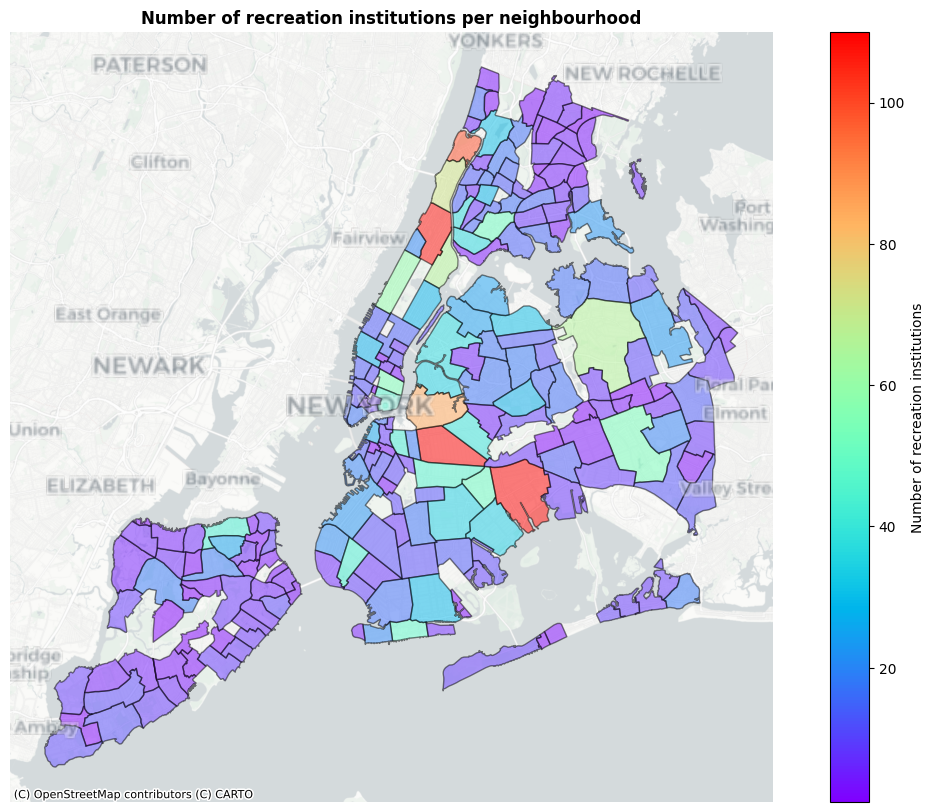

In [39]:
plots.plot_count_per_neighbourhood(recreation_gdf, 'Number of recreation institutions per neighbourhood')

In [40]:
listings['distance_to_nearest_recreation_point_m'] = get_distance_to_nearest_point(listings, recreation_gdf)
listings[f'number_of_recreation_points_within_{radius_meters}m'] = get_number_of_points_within_radius(listings, recreation_gdf, radius_meters)

100%|██████████| 32826/32826 [00:35<00:00, 917.21it/s]


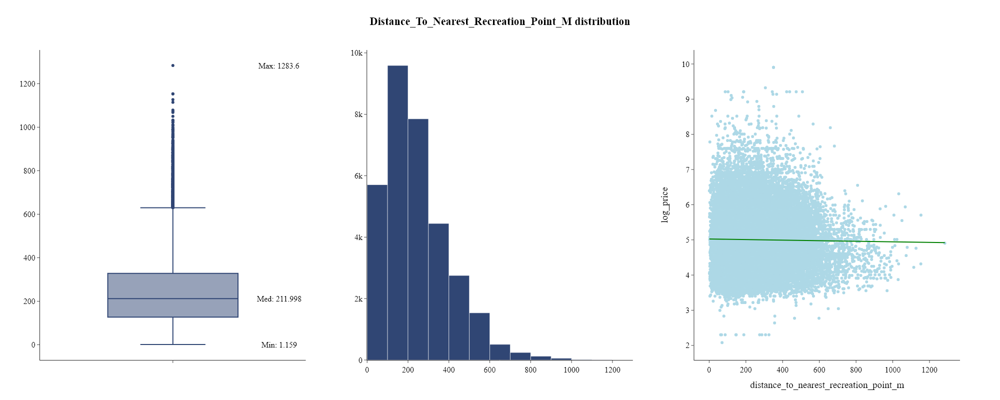

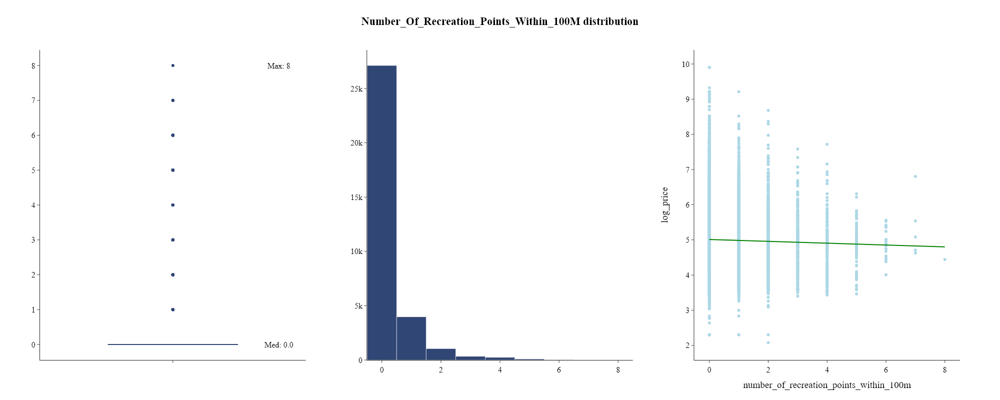

In [57]:
plots.histogram_boxplot_linear_regression(listings, "distance_to_nearest_recreation_point_m", "log_price", name="distance_to_nearest_recreation_point_m", annotations=["Min", "Med", "Max"], bin_size=100)
plots.histogram_boxplot_linear_regression(listings, f'number_of_recreation_points_within_{radius_meters}m', "log_price", name=f'number_of_recreation_points_within_{radius_meters}m', annotations=["Med", "Max"], bin_size=1)

## Religion

In [42]:
religious_gdf = read_table_from_db('religious')
religious_gdf.head()

,id,name,latitude,longitude,geometry
0,1,COLUMBIA UNIVERSITY ST PAULS CHAPEL,40.8078,-73.9609,POINT (-73.96088 40.8078)
1,2,AAA SFARD CONGREGATION,40.6379,-73.8980,POINT (-73.898 40.63792)
2,3,TIMES SQUARE CHURCH,40.7626,-73.9843,POINT (-73.98433 40.76258)
3,4,HOLY NATIVITY EPISCOPAL CHURCH,40.8736,-73.8798,POINT (-73.8798 40.87359)
4,5,FIRST PRESBYTERIAN CHURCH,40.7345,-73.9952,POINT (-73.99517 40.7345)


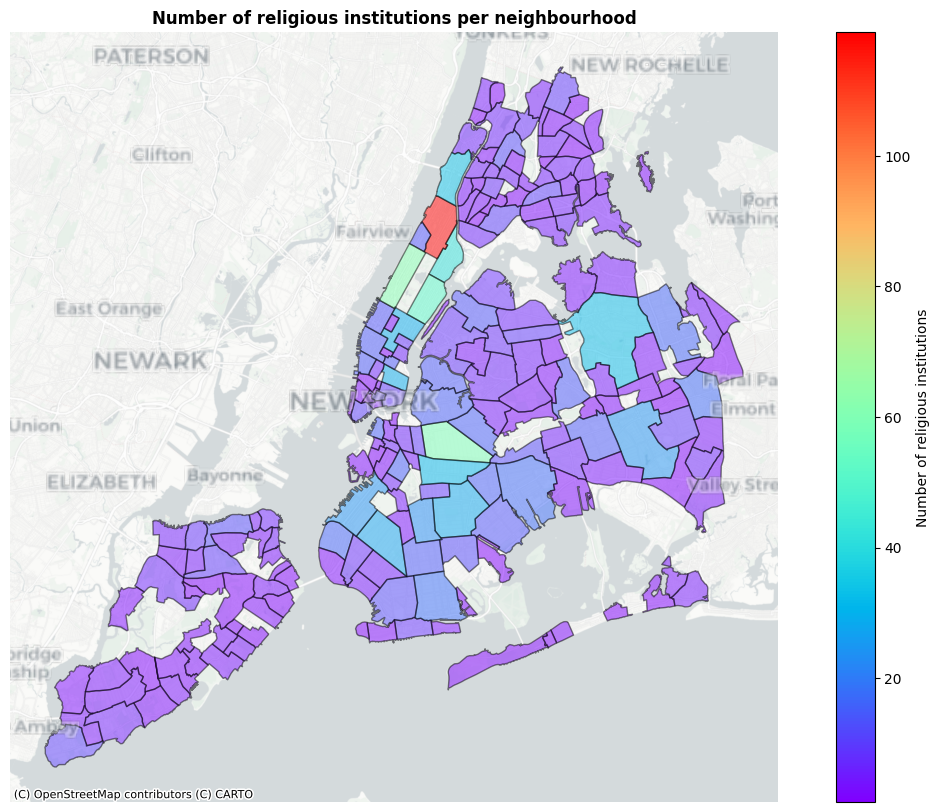

In [43]:
plots.plot_count_per_neighbourhood(religious_gdf, 'Number of religious institutions per neighbourhood')

In [44]:
listings['distance_to_nearest_religious_institution_m'] = get_distance_to_nearest_point(listings, religious_gdf)
listings[f'number_of_religious_institutions_within_{radius_meters}m'] = get_number_of_points_within_radius(listings, religious_gdf, radius_meters)

100%|██████████| 32826/32826 [00:19<00:00, 1714.51it/s]


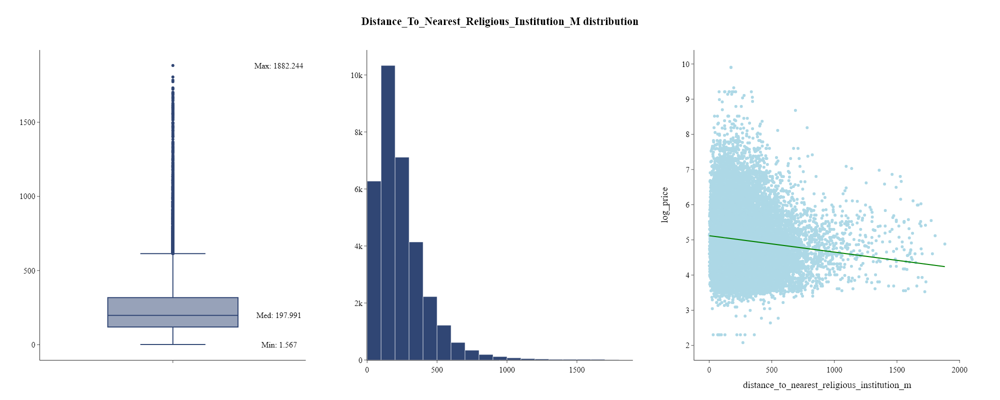

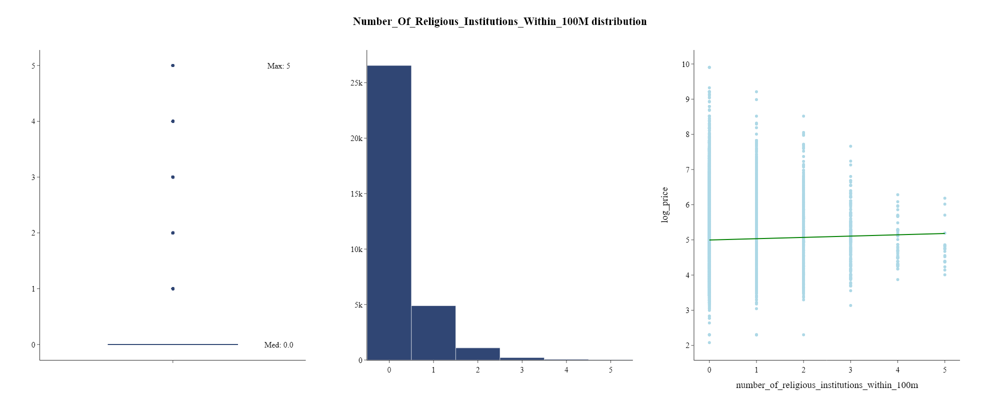

In [56]:
plots.histogram_boxplot_linear_regression(listings, "distance_to_nearest_religious_institution_m", "log_price", name="distance_to_nearest_religious_institution_m", annotations=["Min", "Med", "Max"], bin_size=100)
plots.histogram_boxplot_linear_regression(listings, f'number_of_religious_institutions_within_{radius_meters}m', "log_price", name=f'number_of_religious_institutions_within_{radius_meters}m', annotations=["Med", "Max"], bin_size=1)

## Health

In [46]:
health_gdf = read_table_from_db('health')
health_gdf.head()

,id,name,latitude,longitude,geometry
0,1,CONEY ISLAND HOSPITAL,40.5861,-73.9656,POINT (-73.96564 40.58612)
1,2,NYU LANGONE MEDICAL CENTER,40.7422,-73.9743,POINT (-73.97427 40.74217)
2,3,JACOBI HOSPITAL NURSES RESIDENCE,40.8546,-73.8466,POINT (-73.84655 40.85461)
3,4,NY BLOOD CENTER VERNON BLVD,40.7478,-73.9521,POINT (-73.95209 40.74784)
4,5,EINSTEIN COLLEGE CHANIN INSTITUTE FOR CANCER R...,40.8500,-73.8458,POINT (-73.84584 40.85003)


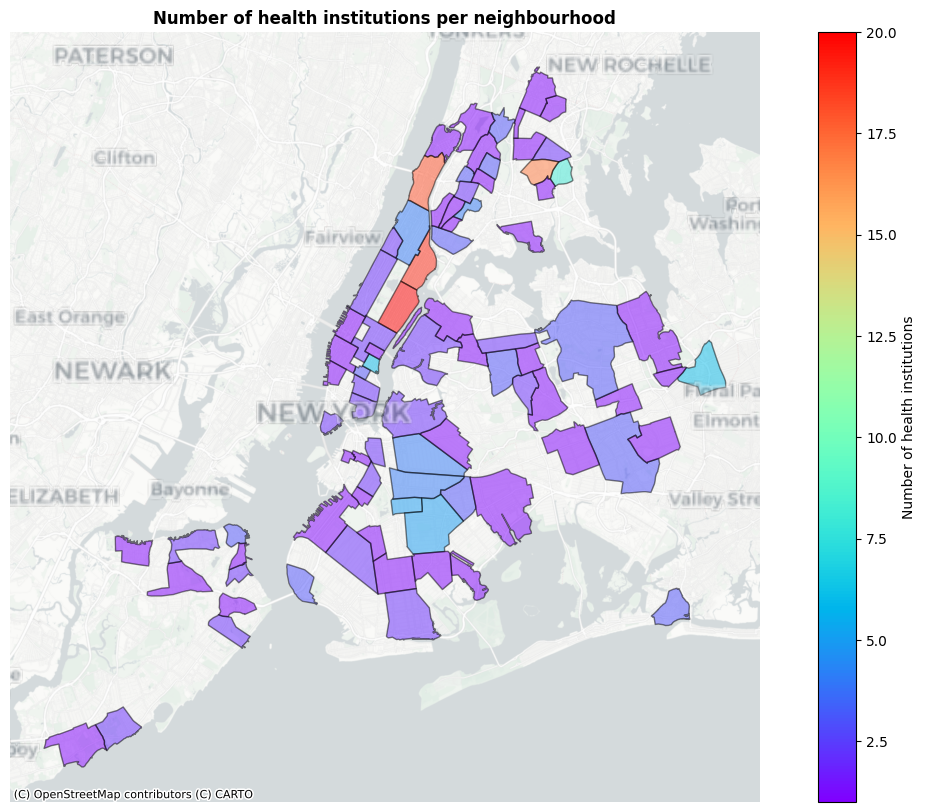

In [47]:
plots.plot_count_per_neighbourhood(health_gdf, 'Number of health institutions per neighbourhood')

In [48]:
listings['distance_to_nearest_health_institution_m'] = get_distance_to_nearest_point(listings, health_gdf)
listings[f'number_of_health_institutions_within_{radius_meters}m'] = get_number_of_points_within_radius(listings, health_gdf, radius_meters)

100%|██████████| 32826/32826 [00:09<00:00, 3389.37it/s]


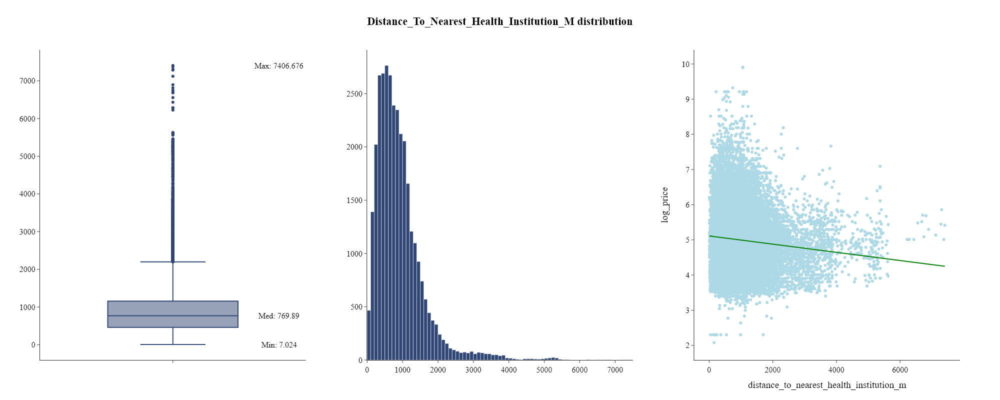

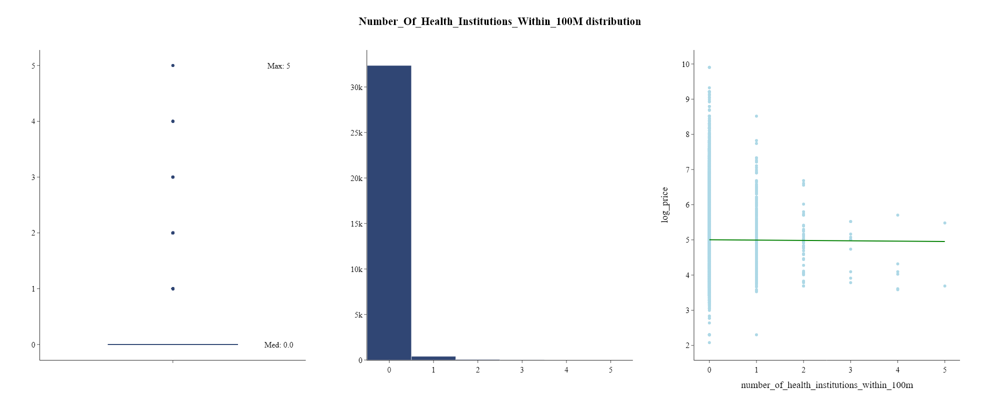

In [61]:
plots.histogram_boxplot_linear_regression(listings, "distance_to_nearest_health_institution_m", "log_price", name="distance_to_nearest_health_institution_m", annotations=["Min", "Med", "Max"], bin_size=100)
plots.histogram_boxplot_linear_regression(listings, f'number_of_health_institutions_within_{radius_meters}m', "log_price", name=f'number_of_health_institutions_within_{radius_meters}m', annotations=["Med", "Max"], bin_size=1)

# Main attractions

In [50]:
main_attractions_gdf = read_table_from_db('main_attractions')
main_attractions_gdf.head()

,id,name,latitude,longitude,geometry
0,1,Central Park,40.7851,-73.9683,POINT (-73.96828 40.78509)
1,2,The National 9/11 Memorial & Museum,40.7115,-74.0133,POINT (-74.0133 40.7115)
2,3,The Metropolitan Museum of Art,40.7794,-73.9632,POINT (-73.96324 40.77944)
3,4,Empire State Building,40.7488,-73.9854,POINT (-73.98543 40.74882)
4,5,The High Line,40.7480,-74.0048,POINT (-74.00476 40.74799)


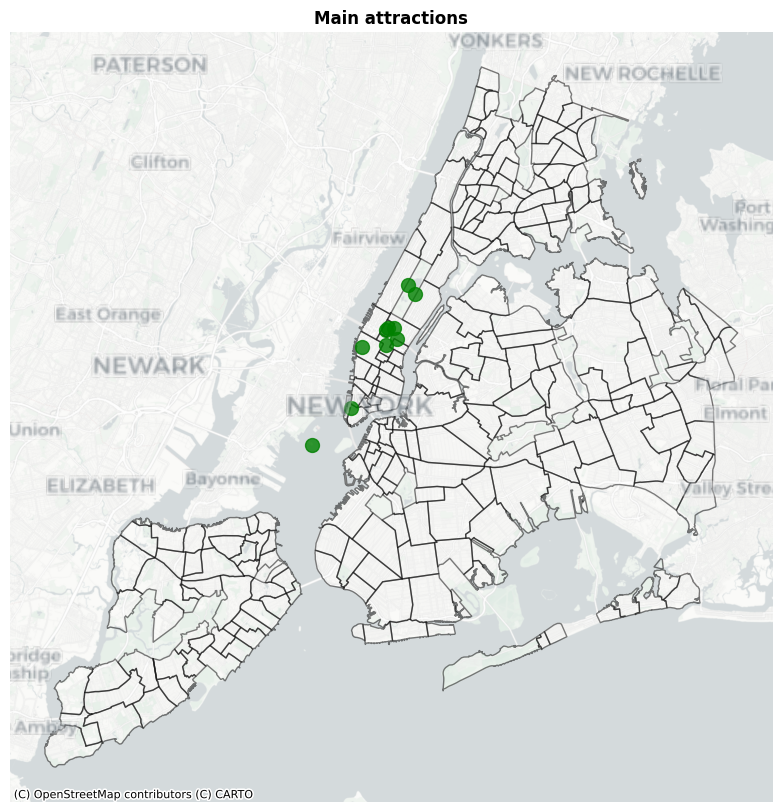

In [51]:
plots.plot_points(main_attractions_gdf, 'Main attractions', 'green', marker_size=100)

In [52]:
listings['distance_to_nearest_main_attraction_m'] = get_distance_to_nearest_point(listings, main_attractions_gdf)

  0%|          | 0/32826 [00:00<?, ?it/s]

100%|██████████| 32826/32826 [00:03<00:00, 10404.44it/s]


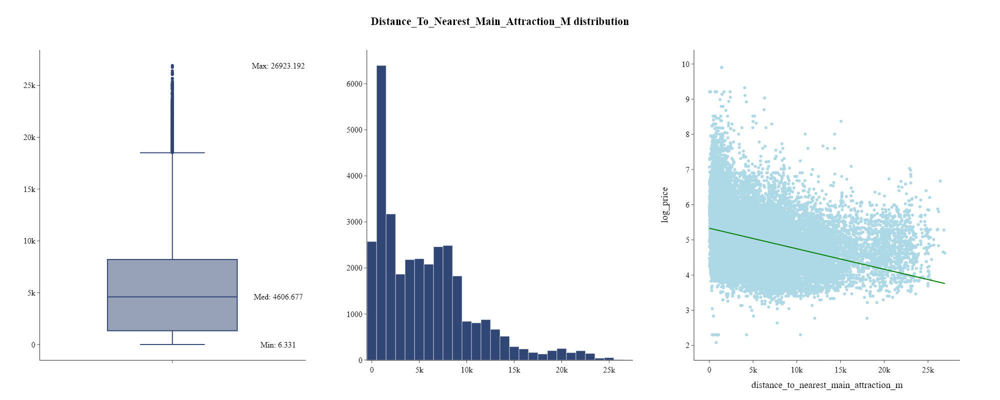

In [53]:
plots.histogram_boxplot_linear_regression(listings, "distance_to_nearest_main_attraction_m", "log_price", name="distance_to_nearest_main_attraction_m", annotations=["Min", "Med", "Max"], bin_size=1000)

## Correlation plot

After creation of all location-based features, we will plot a correlation matrix to see how they are correlated with each other and with the target variable.

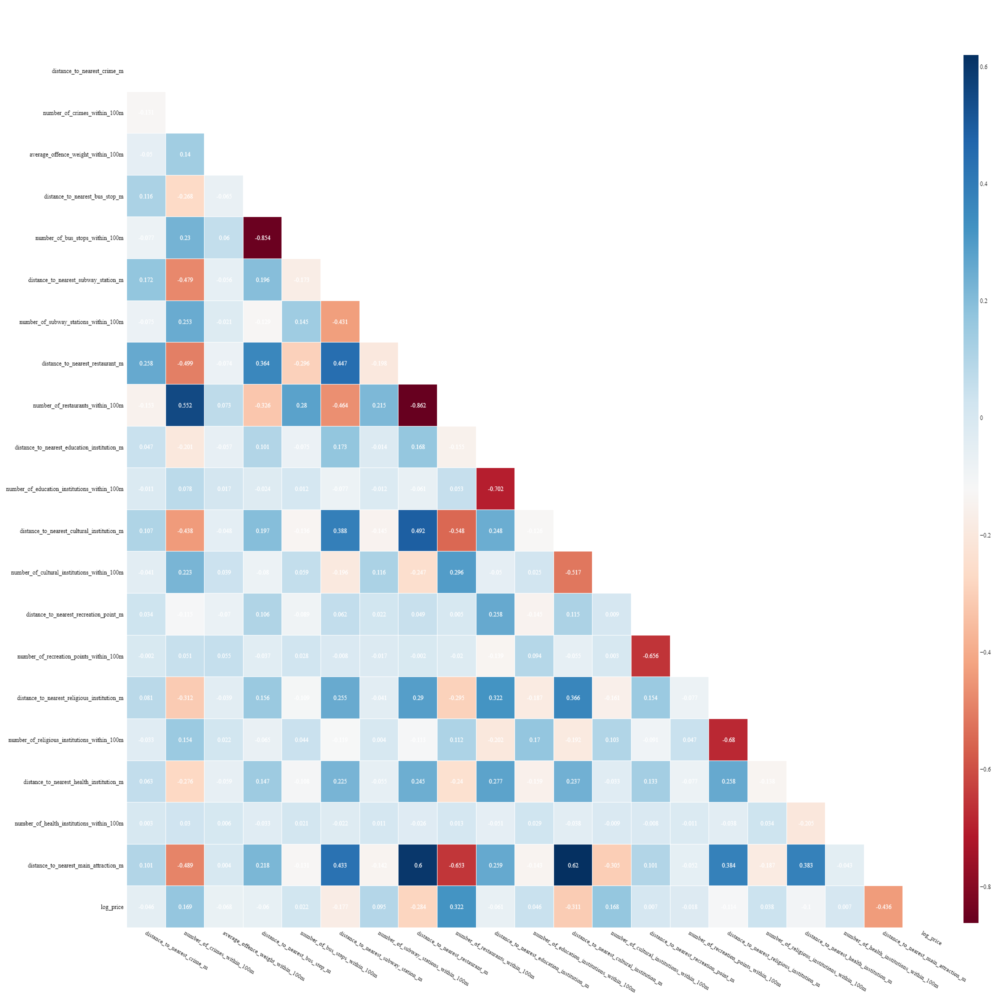

In [54]:
Location_features = ['distance_to_nearest_crime_m', f'number_of_crimes_within_{radius_meters}m', f'average_offence_weight_within_{radius_meters}m',
                    'distance_to_nearest_bus_stop_m', f'number_of_bus_stops_within_{radius_meters}m',
                    'distance_to_nearest_subway_station_m', f'number_of_subway_stations_within_{radius_meters}m',
                    'distance_to_nearest_restaurant_m', f'number_of_restaurants_within_{radius_meters}m',
                    'distance_to_nearest_education_institution_m', f'number_of_education_institutions_within_{radius_meters}m',
                    'distance_to_nearest_cultural_institution_m', f'number_of_cultural_institutions_within_{radius_meters}m',
                    'distance_to_nearest_recreation_point_m', f'number_of_recreation_points_within_{radius_meters}m',
                    'distance_to_nearest_religious_institution_m', f'number_of_religious_institutions_within_{radius_meters}m',
                    'distance_to_nearest_health_institution_m', f'number_of_health_institutions_within_{radius_meters}m',
                    'distance_to_nearest_main_attraction_m']
plots.correlation_plot(listings[Location_features+["log_price"]], Location_features+["log_price"], method="spearman")
Location_features.insert(0, 'listing_id')
for col in listings.columns:
    if col.startswith('borough'):
        Location_features.insert(1, col)

**Notes:**
- Most variables related with distance are negatively correlated with price, as expected. The highest negative correlation is between `distance_to_nearest_main_attraction_m` and `price`.
- The highest positive correlation between target variable and location-based feature is `number_of_restaurants_within_100m`.
- As expected there are some strong negative correlations between distance and number of venues within a certain radius. For example, `distance_to_nearest_bus_stop_m` and `number_of_bus_stops_within_100m` have a correlation of -0.85.

# Save locations to DB

In [65]:
table_name = "location_features"
drop_table_script = f"""
DROP TABLE IF EXISTS {table_name};
"""
cursor.execute(drop_table_script)

In [66]:
table_name = "location_features"
drop_table_script = f"""
DROP TABLE IF EXISTS {table_name};
"""
cursor.execute(drop_table_script)
create_script = f"""
CREATE TABLE {table_name} (
    listing_id BIGINT PRIMARY KEY NOT NULL,
    borough_Queens INT,
    borough_Manhattan INT,
    borough_Brooklyn INT,
    borough_Bronx INT,
    distance_to_nearest_crime_m FLOAT,
    number_of_crimes_within_{radius_meters}m INT,
    average_offence_weight_within_{radius_meters}m FLOAT,
    distance_to_nearest_bus_stop_m FLOAT,
    number_of_bus_stops_within_{radius_meters}m INT,
    distance_to_nearest_subway_station_m FLOAT,
    number_of_subway_stations_within_{radius_meters}m INT,
    distance_to_nearest_restaurant_m FLOAT,
    number_of_restaurants_within_{radius_meters}m INT,
    distance_to_nearest_education_institution_m FLOAT,
    number_of_education_institutions_within_{radius_meters}m INT,
    distance_to_nearest_cultural_institution_m FLOAT,
    number_of_cultural_institutions_within_{radius_meters}m INT,
    distance_to_nearest_recreation_point_m FLOAT,
    number_of_recreation_points_within_{radius_meters}m INT,
    distance_to_nearest_religious_institution_m FLOAT,
    number_of_religious_institutions_within_{radius_meters}m INT,
    distance_to_nearest_health_institution_m FLOAT,
    number_of_health_institutions_within_{radius_meters}m INT,
    distance_to_nearest_main_attraction_m FLOAT
);
"""
cursor.execute(create_script)

In [67]:
insert_script = f"""
INSERT INTO {table_name} ({', '.join(Location_features)}) VALUES ({', '.join(['%s' for _ in range(len(Location_features))])});
"""
for idx, row in listings[Location_features].iterrows():
    cursor.execute(insert_script, tuple(row))
DB.commit()
cursor.close()